This notebook contains the code for the following tasks:
- NEW CODE:
    - loading the files with all info and making a json-file per node
    - making the graph from node-files
    - code for looking at the info of a specific node
- OLD CODE:
    - checking the structure of a json file

# Making the graph:

In [11]:
# Import statements
import os
import re
import json
import csv
import networkx as nx
from langdetect import detect, LangDetectException
from community import community_louvain
from deep_translator import GoogleTranslator
from networkx.algorithms.community import k_clique_communities
from networkx.algorithms.community import modularity
import matplotlib.pyplot as plt
import numpy as np  
from networkx.algorithms.community.quality import modularity

In [3]:
!pip install deep-translator

### Loading the json-files, comment-files and transcript-files for each node and storing it translated with the used attributes in a node-json file in the node_files folder: PAULA

In [12]:
translator = GoogleTranslator()

# Paths to the folders
comments_base_path = "node-files exist"  # Folder containing country folders with comments
transcripts_base_path = "Data/video_transcripts"  # Folder containing country folders with transcripts
json_folder = "Data/complete"
node_files_folder = "Data/node_files"  # Folder where node data will be saved

# Create the node_files folder if it doesn't exist
if not os.path.exists(node_files_folder):
    os.makedirs(node_files_folder)

# Iterate over country folders in the comments directory
country_folders = [folder for folder in os.listdir(comments_base_path) if os.path.isdir(os.path.join(comments_base_path, folder))]

print("Nr. of countries:", len(country_folders))

# Initialize count
count = 0  # Total number of videos processed

for country_folder in country_folders:
    comments_country_path = os.path.join(comments_base_path, country_folder)
    transcripts_country_path = os.path.join(transcripts_base_path, country_folder)  # Corresponding transcript folder
    country_name = country_folder

    print("Processing country:", country_name)

    # Load the corresponding JSON file for video data
    json_file_path = os.path.join(json_folder, f"{country_name}.json")
    with open(json_file_path, 'r', encoding='utf-8') as f:
        video_data = json.load(f)

    # Map video ID to its attributes
    video_attributes = {
        video['id']: {
            "title": video.get('snippet', {}).get('title', ''),
            "channelTitle": video.get('snippet', {}).get('channelTitle', ''),
            "description": video.get('snippet', {}).get('description', ''),
            "viewCount": video.get('statistics', {}).get('viewCount', '0'),
            "likeCount": video.get('statistics', {}).get('likeCount', '0'),
            "publishedAt": video.get('snippet', {}).get('publishedAt', ''),
            "tags": video.get('snippet', {}).get('tags', []),
            "categoryId": video.get('snippet', {}).get('categoryId', '')
        }
        for video in video_data
    }

    # Iterate over txt files in the comments folder
    txt_files = [file for file in os.listdir(comments_country_path) if file.endswith('.txt')]
    count += len(txt_files)

    for txt_file in txt_files:
        video_name = os.path.splitext(txt_file)[0]

        # Read comments from the txt file
        txt_file_path = os.path.join(comments_country_path, txt_file)
        with open(txt_file_path, 'r', encoding='utf-8') as f:
            comments = f.read()

        # Check for transcript file
        transcript_file_path = os.path.join(transcripts_country_path, f"{video_name}.txt")
        transcript = None
        if os.path.exists(transcript_file_path):
            with open(transcript_file_path, 'r', encoding='utf-8') as f:
                transcript = f.read()

        # Define the node file path
        node_file_path = os.path.join(node_files_folder, f"{video_name}.json")

        # If the node already exists, update only the country attribute
        if os.path.exists(node_file_path):
            with open(node_file_path, 'r', encoding='utf-8') as f:
                node_data = json.load(f)

            if 'country' not in node_data:
                node_data['country'] = []
            if country_name not in node_data['country']:
                node_data['country'].append(country_name)

            # Save the updated node
            with open(node_file_path, 'w', encoding='utf-8') as f:
                json.dump(node_data, f, ensure_ascii=False, indent=4)

            continue

        # Create a new node
        node_data = {
            "comments": comments,
            "country": [country_name],
        }

        if transcript:
            node_data["transcript"] = transcript

        # Add video attributes if they exist
        if video_name in video_attributes:
            video_info = video_attributes[video_name]
            node_data.update(video_info)

            # Translate description if necessary
            description = video_info.get("description", "")
            try:
                if description and detect(description) != "en":
                    node_data["description"] = translator.translate(description, source="auto", target="en")
            except Exception as e:
                print(f"Error translating description for '{video_name}': {e}")

            # Translate tags if necessary
            tags = video_info.get("tags", [])
            translated_tags = []
            for tag in tags:
                try:
                    if detect(tag) != "en":
                        translated_tags.append(translator.translate(tag, source="auto", target="en"))
                    else:
                        translated_tags.append(tag)
                except Exception as e:
                    print(f"Error translating tag '{tag}' for '{video_name}': {e}")
                    translated_tags.append(tag)
            node_data["tags"] = translated_tags

        # Save the new node
        with open(node_file_path, 'w', encoding='utf-8') as f:
            json.dump(node_data, f, ensure_ascii=False, indent=4)
            
        print(f"New node for '{video_name}' saved.")

print(f"Total videos processed: {count}")

Nr. of countries: 45
Processing country: Indonesia_ID
Processing country: Jordan_JO
Processing country: Spain_ES
Processing country: India_IN
Processing country: Argentina_AR
Processing country: Japan_JP
Processing country: Iceland_IS
Processing country: Costa_Rica_CR
Processing country: Austria_AT
Processing country: Bulgaria_BG
Processing country: Thailand_TH
Processing country: Bolivia_BO
Processing country: Germany_DE
Processing country: Colombia_CO
Processing country: United_States_US
Processing country: Honduras_HN
Processing country: Ecuador_EC
Processing country: North_Macedonia_MK
Processing country: Cyprus_CY
Processing country: Paraguay_PY
Processing country: France_FR
Processing country: Luxembourg_LU
Processing country: Brazil_BR
Processing country: United_Kingdom_GB
Processing country: Algeria_DZ
Processing country: Australia_AU
Processing country: Nicaragua_NI
Processing country: Kuwait_KW
Processing country: Canada_CA
Processing country: Egypt_EG
Processing country: Gua

### Loading network from the "node_files" folder:

In [9]:
# Initialize the graph
G = nx.Graph()

# Path to the folder with saved node files
node_files_folder = "Data/node_files"

# Load the node information from the "node_files" folder
node_files = [file for file in os.listdir(node_files_folder) if file.endswith('.json')]

# Iterate over each saved node file to load attributes and build the graph
for node_file in node_files:
    node_file_path = os.path.join(node_files_folder, node_file)
    
    with open(node_file_path, 'r', encoding='utf-8') as f:
        node_data = json.load(f)
    
    video_name = os.path.splitext(node_file)[0]
    
    # Add node to the graph with the loaded attributes
    G.add_node(video_name, **node_data)

# Define the threshold for edge weight
threshold = 0.001  # Adjust this value as needed

# Add weighted edges based on shared tags
nodes = list(G.nodes(data=True))
for i, (node1, attr1) in enumerate(nodes):
    tags1 = set(attr1.get('tags', []))
    for j in range(i + 1, len(nodes)):
        node2, attr2 = nodes[j]
        tags2 = set(attr2.get('tags', []))
        
        # Calculate the weight as [number of shared tags] / [sum of tags of the two nodes]
        shared_tags = tags1 & tags2
        weight = len(shared_tags) / (len(tags1) + len(tags2)) if (len(tags1) + len(tags2)) > 0 else 0
        
        # Add the edge only if the weight is above the threshold
        if weight > threshold:
            G.add_edge(node1, node2, weight=weight)

print("Total number of nodes:", G.number_of_nodes())

# Remove isolated nodes
isolated_nodes = [node for node in G.nodes if G.degree(node) == 0]
G.remove_nodes_from(isolated_nodes)

# Print network summary
print("Total number of nodes after removing isolated ones:", G.number_of_nodes())
print("Total number of edges:", G.number_of_edges())

Total number of nodes: 1820
Total number of nodes after removing isolated ones: 1595
Total number of edges: 25134


### Plotting the number of links per threshold (use that to argue which threshold we took):

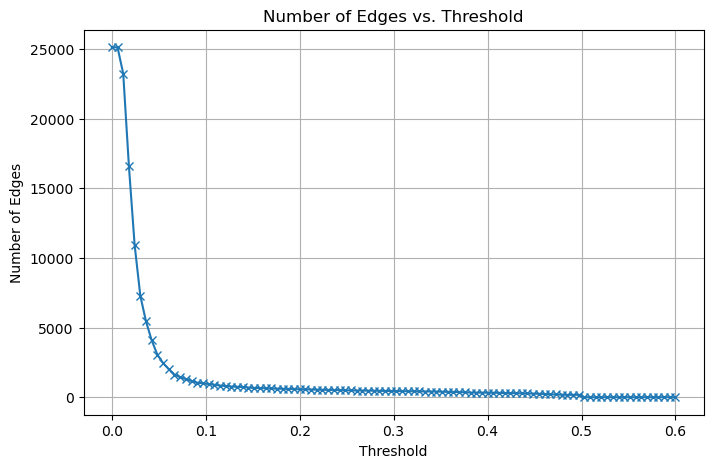

In [13]:
# Define a range of thresholds to evaluate
thresholds = np.linspace(0, 0.6, 100)  # 100 thresholds between 0 and 0.6 (afterwards are barely ay edges)
edge_counts = []

# Evaluate the number of edges for each threshold
for threshold in thresholds:
    temp_graph = nx.Graph()
    
    # Add edges to the temporary graph based on the current threshold
    for i, (node1, attr1) in enumerate(nodes):
        tags1 = set(attr1.get('tags', []))
        for j in range(i + 1, len(nodes)):
            node2, attr2 = nodes[j]
            tags2 = set(attr2.get('tags', []))
            
            shared_tags = tags1 & tags2
            weight = len(shared_tags) / (len(tags1) + len(tags2)) if (len(tags1) + len(tags2)) > 0 else 0
            
            if weight > threshold:
                temp_graph.add_edge(node1, node2, weight=weight)
    
    # Record the number of edges for this threshold
    edge_counts.append(temp_graph.number_of_edges())

# Plot the threshold vs. edge count
plt.figure(figsize=(8, 5))
plt.plot(thresholds, edge_counts, marker='x')
plt.xlabel("Threshold")
plt.ylabel("Number of Edges")
plt.title("Number of Edges vs. Threshold")
plt.grid(True)
plt.show()


# Sentiment Analysis

In [7]:
# Function to load the LabMT word list from a CSV file and create a dictionary
def load_labmt_word_list(csv_file_path):
    labmt_words = {}

    # Open and read the CSV file
    with open(csv_file_path, mode='r', encoding='utf-8') as csv_file:
        csv_reader = csv.DictReader(csv_file)  # Use DictReader for column names
        for row in csv_reader:
            word = row['word'].lower()  # Get the word and convert to lowercase
            happiness_score = float(row['happiness_average'])  # Get the happiness score as a float
            labmt_words[word] = happiness_score  # Add word and score to the dictionary
    
    return labmt_words

csv_file_path = 'labMIT.csv'  # Replace with the correct file path
labmt_words_dict = load_labmt_word_list(csv_file_path)

print({k: labmt_words_dict[k] for k in list(labmt_words_dict)[:10]})

{'laughter': 8.5, 'happiness': 8.44, 'love': 8.42, 'happy': 8.3, 'laughed': 8.26, 'laugh': 8.22, 'laughing': 8.2, 'excellent': 8.18, 'laughs': 8.18, 'joy': 8.16}


In [23]:
# Function to calculate sentiment score
def calculate_sentiment(tokens, labmt_words):
    sentiment_score = 0
    count = 0
    for token in tokens:
        if token in labmt_words:
            sentiment_score += labmt_words[token]
            count += 1
    return sentiment_score / count if count > 0 else 0

# Function to tokenize text
def process_text(text):
    tokens = re.findall(r'\b\w+\b', text.lower())
    return tokens

# Folder containing JSON files for each node
folder_path = 'node_files'

# Iterate over each node in the network
for node in G.nodes():
    file_path = os.path.join(folder_path, f"{node}.json")
    
    if os.path.exists(file_path):
        # Load the JSON file
        with open(file_path, 'r', encoding='utf-8') as file:
            data = json.load(file)
        
        # Extract comments and transcript
        comments = data.get('comments', '')
        transcript = data.get('transcript', '')
        
        # Tokenize comments and transcript
        comment_tokens = process_text(comments)
        transcript_tokens = process_text(transcript)
        
        # Calculate sentiment scores
        comment_sentiment = calculate_sentiment(comment_tokens, labmt_words_dict)
        transcript_sentiment = calculate_sentiment(transcript_tokens, labmt_words_dict)
        
        # Compare sentiment scores
        sentiment_comparison = {
            'comments_sentiment': comment_sentiment,
            'transcript_sentiment': transcript_sentiment,
            'difference': abs(comment_sentiment - transcript_sentiment)
        }
        
        # Add sentiment scores as nodal properties
        G.nodes[node]['sentiment_comparison'] = sentiment_comparison
    else:
        print(f"File not found for {node}")

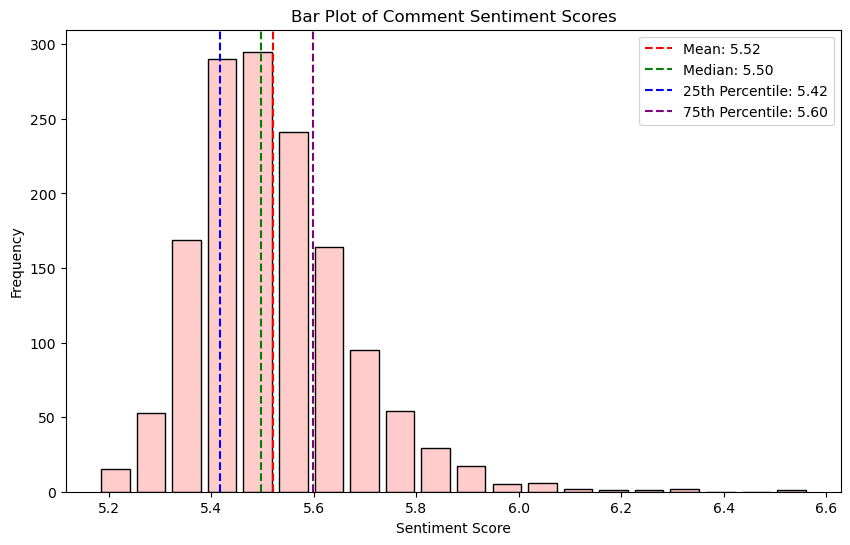

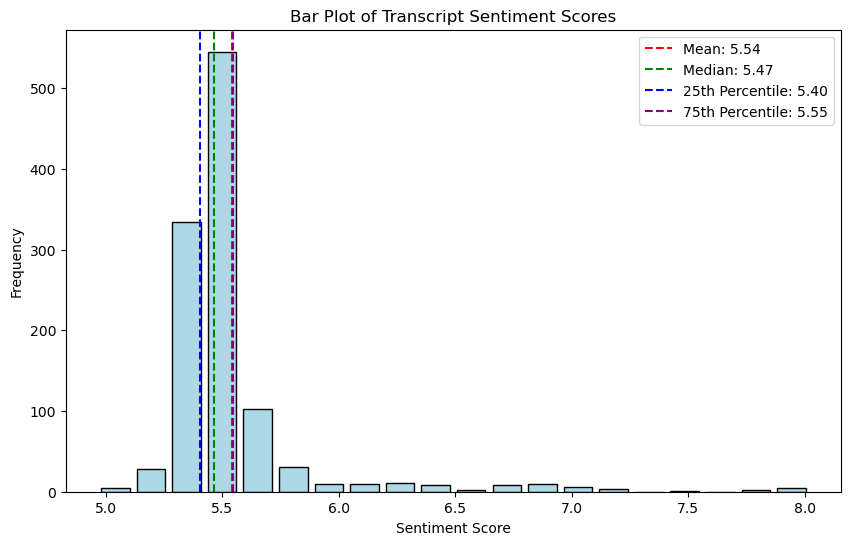


Top 10 Saddest Comments:
Q3woJb3ZxnA: 5.18
pifXtqxDPkE: 5.18
wcPOoLxyqJs: 5.20
6BMKx4sQ2o8: 5.21
EOEGxRWUD5U: 5.21
GG-LuSOOj4M: 5.22
8QCTBe9d4UQ: 5.22
rlgnJddIqYk: 5.23
Tnhk24VIaBQ: 5.23
Kf3Fsz-FB0s: 5.23

Top 10 Happiest Comments:
G0khxiHpLns: 6.05
5ItXR6Uvhz0: 6.06
m6YeUYNqVJM: 6.08
p4H3tp-IPjI: 6.11
lVZTKtP4ahU: 6.11
LV4KJToHI14: 6.21
SejjFSFDVT8: 6.28
r7Q9HnfbwHA: 6.30
qW8TzBsQTHQ: 6.30
jMZ8eYe3zio: 6.57

Top 10 Saddest Transcripts:
T7JALER7rmw: 4.97
hwE4M3DIOTk: 5.05
2LE1EJ0JRG0: 5.09
nVIHHcNfszw: 5.10
MDWvfD5nbyI: 5.10
jg4mZak7wzQ: 5.12
LeH-Vx4domw: 5.13
9NEgr1l5glg: 5.14
Om0dEWMlCds: 5.15
mQnBctuwa70: 5.16

Top 10 Happiest Transcripts:
4Ul3pSW_79E: 7.15
VCyko5WJQwg: 7.22
9VU7hCCkzKg: 7.53
r0oasQkLYN8: 7.73
vyIc6LbHzQs: 7.82
F99OdZ5G8XU: 8.02
KXFuNaYBmyo: 8.02
OYWO7VGfvcw: 8.02
qkE11ladri8: 8.02
_P50ZxuF9rY: 8.02


In [25]:
import numpy as np
import matplotlib.pyplot as plt

# Step 1: Extract all sentiment values separately for comments and transcripts, ignoring None and 0 values
comment_sentiments = [
    data['sentiment_comparison']['comments_sentiment']
    for node, data in G.nodes(data=True)
    if data.get('sentiment_comparison', {}).get('comments_sentiment') not in (None, 0)
]

transcript_sentiments = [
    data['sentiment_comparison']['transcript_sentiment']
    for node, data in G.nodes(data=True)
    if data.get('sentiment_comparison', {}).get('transcript_sentiment') not in (None, 0)
]

# Helper function to calculate statistics and plot
def plot_sentiment_distribution(sentiments, title, color, xlabel='Sentiment Score', ylabel='Frequency'):
    # Step 2: Calculate statistical measures
    mean_sentiment = np.mean(sentiments)
    median_sentiment = np.median(sentiments)
    variance_sentiment = np.var(sentiments)
    percentile_25 = np.percentile(sentiments, 25)
    percentile_75 = np.percentile(sentiments, 75)
    
    # Step 3: Create bins for the sentiment values
    num_bins = 20
    bin_edges = np.linspace(min(sentiments), max(sentiments), num_bins + 1)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    
    # Calculate frequency in each bin
    frequencies, _ = np.histogram(sentiments, bins=bin_edges)
    
    # Step 4: Plot a bar plot for sentiment frequencies
    plt.figure(figsize=(10, 6))
    bar_width = (bin_edges[1] - bin_edges[0]) * 0.8  # Set bar width to 80% to create spacing
    plt.bar(bin_centers, frequencies, width=bar_width, color=color, edgecolor='black')
    
    # Add mean, median, 25th and 75th percentiles, etc.
    plt.axvline(mean_sentiment, color='red', linestyle='dashed', linewidth=1.5, label=f'Mean: {mean_sentiment:.2f}')
    plt.axvline(median_sentiment, color='green', linestyle='dashed', linewidth=1.5, label=f'Median: {median_sentiment:.2f}')
    plt.axvline(percentile_25, color='blue', linestyle='dashed', linewidth=1.5, label=f'25th Percentile: {percentile_25:.2f}')
    plt.axvline(percentile_75, color='purple', linestyle='dashed', linewidth=1.5, label=f'75th Percentile: {percentile_75:.2f}')
    
    # Title and labels
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend()
    plt.show()

# Plot for comments
plot_sentiment_distribution(
    comment_sentiments,
    title='Bar Plot of Comment Sentiment Scores',
    color='#ffcccb'
)

# Plot for transcripts
plot_sentiment_distribution(
    transcript_sentiments,
    title='Bar Plot of Transcript Sentiment Scores',
    color='#add8e6'  # Light blue color
)

# Step 5: Find the 10 artists with the happiest and saddest comments
comment_filtered = [
    (node, data['sentiment_comparison']['comments_sentiment'])
    for node, data in G.nodes(data=True)
    if data.get('sentiment_comparison', {}).get('comments_sentiment') not in (None, 0)
]
transcript_filtered = [
    (node, data['sentiment_comparison']['transcript_sentiment'])
    for node, data in G.nodes(data=True)
    if data.get('sentiment_comparison', {}).get('transcript_sentiment') not in (None, 0)
]

comment_sorted = sorted(comment_filtered, key=lambda x: x[1])
transcript_sorted = sorted(transcript_filtered, key=lambda x: x[1])

# Top 10 saddest and happiest comments
saddest_comments = comment_sorted[:10]
happiest_comments = comment_sorted[-10:]

# Top 10 saddest and happiest transcripts
saddest_transcripts = transcript_sorted[:10]
happiest_transcripts = transcript_sorted[-10:]

# Print results
print("\nTop 10 Saddest Comments:")
for artist, sentiment in saddest_comments:
    print(f"{artist}: {sentiment:.2f}")

print("\nTop 10 Happiest Comments:")
for artist, sentiment in happiest_comments:
    print(f"{artist}: {sentiment:.2f}")

print("\nTop 10 Saddest Transcripts:")
for artist, sentiment in saddest_transcripts:
    print(f"{artist}: {sentiment:.2f}")

print("\nTop 10 Happiest Transcripts:")
for artist, sentiment in happiest_transcripts:
    print(f"{artist}: {sentiment:.2f}")


### The structural communities based on the Python Louvain-algorithm will be detected:

In [29]:
# Using Louvain to find communities
louvain_partition = community_louvain.best_partition(G)

# Calculating the modularity
partition_louvain = {}
for node, community in louvain_partition.items():
    if community not in partition_louvain:
        partition_louvain[community] = []
    partition_louvain[community].append(node)

# Convert partition into a list of sets for modularity calculation
partition_list_louvain = [set(nodes) for nodes in partition_louvain.values()]
modularity_value_louvain = nx.algorithms.community.quality.modularity(G, partition_list_louvain)

# Displaying results
print(f"Number of Louvain communities detected: {len(partition_louvain)}")
print(f"Louvain modularity: {modularity_value_louvain:.5f}")

# Save community assignments to nodes
nx.set_node_attributes(G, louvain_partition, "louvain-community")


Number of Louvain communities detected: 65
Louvain modularity: 0.67223


### Sentiment Analaysis for Louvain Communities

In [33]:
# Step 2: Perform sentiment analysis for comments and transcripts
community_sentiments_comments = {}
community_sentiments_transcripts = {}

folder_path = 'node_files'  # Path to JSON files

for community_id, artists in partition_louvain.items():
    comment_sentiments = []
    transcript_sentiments = []
    
    for artist in artists:
        file_path = os.path.join(folder_path, f"{artist}.json")
        if os.path.exists(file_path):
            # Load JSON data for the artist
            with open(file_path, 'r', encoding='utf-8') as file:
                data = json.load(file)
            
            # Extract comments and transcript sentiment values
            comments = data.get('comments', '')
            transcript = data.get('transcript', '')
            
            # Tokenize and calculate sentiment using the loaded labMT dictionary
            comment_tokens = process_text(comments)
            transcript_tokens = process_text(transcript)
            
            comment_sentiment = calculate_sentiment(comment_tokens, labmt_words_dict)
            transcript_sentiment = calculate_sentiment(transcript_tokens, labmt_words_dict)
            
            if comment_sentiment:
                comment_sentiments.append(comment_sentiment)
            if transcript_sentiment:
                transcript_sentiments.append(transcript_sentiment)
    
    # Calculate average sentiment for the community
    if comment_sentiments:
        community_sentiments_comments[community_id] = np.mean(comment_sentiments)
    if transcript_sentiments:
        community_sentiments_transcripts[community_id] = np.mean(transcript_sentiments)

# Step 3: Identify top communities for comments and transcripts
sorted_comments_communities = sorted(community_sentiments_comments.items(), key=lambda x: x[1], reverse=True)
sorted_transcripts_communities = sorted(community_sentiments_transcripts.items(), key=lambda x: x[1], reverse=True)

# Extract happiest and saddest communities for comments and transcripts
happiest_comments_communities = sorted_comments_communities[:3]
saddest_comments_communities = sorted_comments_communities[-3:]

happiest_transcripts_communities = sorted_transcripts_communities[:3]
saddest_transcripts_communities = sorted_transcripts_communities[-3:]

# Step 4: Display results
#print("\nCommunity-wise Average Sentiment for Comments:")
#for community_id, avg_sent in sorted_comments_communities:
#    print(f"Community {community_id}: Average Comment Sentiment = {avg_sent:.2f}")

#print("\nCommunity-wise Average Sentiment for Transcripts:")
#for community_id, avg_sent in sorted_transcripts_communities:
#    print(f"Community {community_id}: Average Transcript Sentiment = {avg_sent:.2f}")

print("\nTop 3 Happiest Communities for Comments:")
for community_id, avg_sent in happiest_comments_communities:
    print(f"Community {community_id}: Average Comment Sentiment = {avg_sent:.2f}")

print("\nTop 3 Saddest Communities for Comments:")
for community_id, avg_sent in saddest_comments_communities:
    print(f"Community {community_id}: Average Comment Sentiment = {avg_sent:.2f}")

print("\nTop 3 Happiest Communities for Transcripts:")
for community_id, avg_sent in happiest_transcripts_communities:
    print(f"Community {community_id}: Average Transcript Sentiment = {avg_sent:.2f}")

print("\nTop 3 Saddest Communities for Transcripts:")
for community_id, avg_sent in saddest_transcripts_communities:
    print(f"Community {community_id}: Average Transcript Sentiment = {avg_sent:.2f}")



Top 3 Happiest Communities for Comments:
Community 21: Average Comment Sentiment = 5.77
Community 63: Average Comment Sentiment = 5.74
Community 15: Average Comment Sentiment = 5.69

Top 3 Saddest Communities for Comments:
Community 25: Average Comment Sentiment = 5.37
Community 52: Average Comment Sentiment = 5.31
Community 19: Average Comment Sentiment = 5.29

Top 3 Happiest Communities for Transcripts:
Community 31: Average Transcript Sentiment = 6.93
Community 14: Average Transcript Sentiment = 6.92
Community 7: Average Transcript Sentiment = 6.12

Top 3 Saddest Communities for Transcripts:
Community 24: Average Transcript Sentiment = 5.37
Community 49: Average Transcript Sentiment = 5.37
Community 43: Average Transcript Sentiment = 5.18


In [53]:
# Calculate statistical measures for community_sentiments_comments
comments_sentiments = list(community_sentiments_comments.values())

mean_sentiment_comments = np.mean(comments_sentiments)
median_sentiment_comments = np.median(comments_sentiments)
variance_sentiment_comments = np.var(comments_sentiments)
percentile_25_comments = np.percentile(comments_sentiments, 25)
percentile_75_comments = np.percentile(comments_sentiments, 75)

# Calculate statistical measures for community_sentiments_transcripts
transcripts_sentiments = list(community_sentiments_transcripts.values())

mean_sentiment_transcripts = np.mean(transcripts_sentiments)
median_sentiment_transcripts = np.median(transcripts_sentiments)
variance_sentiment_transcripts = np.var(transcripts_sentiments)
percentile_25_transcripts = np.percentile(transcripts_sentiments, 25)
percentile_75_transcripts = np.percentile(transcripts_sentiments, 75)
min_sentiment_comments = min(comments_sentiments)
max_sentiment_comments = max(comments_sentiments)
min_sentiment_transcripts = min(transcripts_sentiments)
max_sentiment_transcripts = max(transcripts_sentiments)

# Print statistical measures with min and max
print("Comments Sentiment Statistics across Louvain Communities:")
print(f"Mean: {mean_sentiment_comments:.2f}")
print(f"Median: {median_sentiment_comments:.2f}")
print(f"Variance: {variance_sentiment_comments:.2f}")
print(f"Min: {min_sentiment_comments:.2f}")
print(f"Max: {max_sentiment_comments:.2f}")
print(f"25th Percentile: {percentile_25_comments:.2f}")
print(f"75th Percentile: {percentile_75_comments:.2f}")

print("\nTranscripts Sentiment Statistics across Louvain Communities:")
print(f"Mean: {mean_sentiment_transcripts:.2f}")
print(f"Median: {median_sentiment_transcripts:.2f}")
print(f"Variance: {variance_sentiment_transcripts:.2f}")
print(f"Min: {min_sentiment_transcripts:.2f}")
print(f"Max: {max_sentiment_transcripts:.2f}")
print(f"25th Percentile: {percentile_25_transcripts:.2f}")
print(f"75th Percentile: {percentile_75_transcripts:.2f}")

Comments Sentiment Statistics across Louvain Communities:
Mean: 5.53
Median: 5.52
Variance: 0.01
Min: 5.29
Max: 5.77
25th Percentile: 5.46
75th Percentile: 5.60

Transcripts Sentiment Statistics across Louvain Communities:
Mean: 5.60
Median: 5.52
Variance: 0.09
Min: 5.18
Max: 6.93
25th Percentile: 5.45
75th Percentile: 5.59


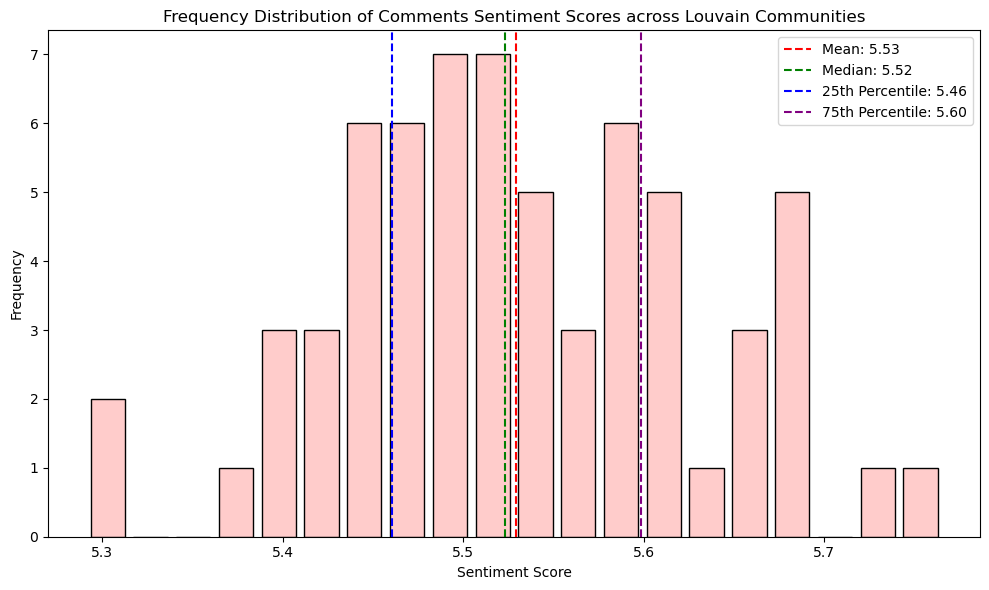

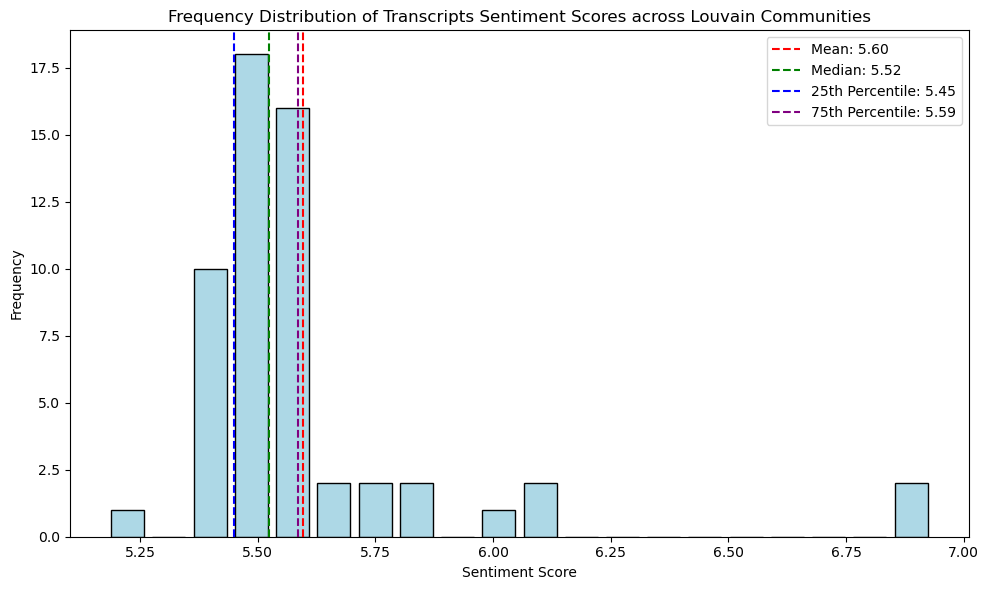

In [59]:
# Function to plot frequency distribution of sentiments with statistics
def plot_sentiment_distribution_with_stats(sentiments, stats, title, color, xlabel='Sentiment Score', ylabel='Frequency'):
    # Calculate frequency distribution
    num_bins = 20
    bin_edges = np.linspace(min(sentiments), max(sentiments), num_bins + 1)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    frequencies, _ = np.histogram(sentiments, bins=bin_edges)
    
    # Create the bar plot
    plt.figure(figsize=(10, 6))
    bar_width = (bin_edges[1] - bin_edges[0]) * 0.8  # Adjust bar width for spacing
    plt.bar(bin_centers, frequencies, width=bar_width, color=color, edgecolor='black')
    
    # Add precomputed statistics as vertical lines
    plt.axvline(stats["Mean"], color='red', linestyle='dashed', linewidth=1.5, label=f'Mean: {stats["Mean"]:.2f}')
    plt.axvline(stats["Median"], color='green', linestyle='dashed', linewidth=1.5, label=f'Median: {stats["Median"]:.2f}')
    plt.axvline(stats["25th Percentile"], color='blue', linestyle='dashed', linewidth=1.5, label=f'25th Percentile: {stats["25th Percentile"]:.2f}')
    plt.axvline(stats["75th Percentile"], color='purple', linestyle='dashed', linewidth=1.5, label=f'75th Percentile: {stats["75th Percentile"]:.2f}')
    
    # Add title and labels
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend()
    plt.tight_layout()
    plt.show()

# Plot frequency distribution for comments with stats
plot_sentiment_distribution_with_stats(
    comments_sentiments,
    {
        "Mean": mean_sentiment_comments,
        "Median": median_sentiment_comments,
        "25th Percentile": percentile_25_comments,
        "75th Percentile": percentile_75_comments,
    },
    title='Frequency Distribution of Comments Sentiment Scores across Louvain Communities',
    color='#ffcccb'  # Light pink
)

# Plot frequency distribution for transcripts with stats
plot_sentiment_distribution_with_stats(
    transcripts_sentiments,
    {
        "Mean": mean_sentiment_transcripts,
        "Median": median_sentiment_transcripts,
        "25th Percentile": percentile_25_transcripts,
        "75th Percentile": percentile_75_transcripts,
    },
    title='Frequency Distribution of Transcripts Sentiment Scores across Louvain Communities',
    color='#add8e6'  # Light blue
)

### Communities and Modularity based on LikeCount and Country (only taken the first country so far):

In [106]:
# Community Assignment by `likeCount`
like_counts = [int(node_data.get('likeCount', 0)) for _, node_data in G.nodes(data=True)]
bins = np.linspace(min(like_counts), max(like_counts), 11)  # Create 10 bins
like_count_partition = {}
for node, data in G.nodes(data=True):
    like_count = int(data.get('likeCount', 0))
    community = np.digitize(like_count, bins)  # Determine the bin index
    data['likeCount_community'] = community
    like_count_partition[node] = community  # Record the community for modularity calculation

# Community Assignment by `country`
country_partition = {}
for node, data in G.nodes(data=True):
    countries = data.get('country', [])
    primary_country = countries[0] if countries else 'Unknown'  # Use the first country if available
    data['country_community'] = primary_country
    country_partition[node] = primary_country  # Record the primary country for modularity calculation

# Modularity calculation for `likeCount_community`
like_count_communities = {c: [] for c in set(like_count_partition.values())}
for node, community in like_count_partition.items():
    like_count_communities[community].append(node)
like_count_modularity = modularity(G, like_count_communities.values())
print(f"Modularity for LikeCount communities: {like_count_modularity:.4f}")

# Modularity calculation for `country_community`
country_communities = {c: [] for c in set(country_partition.values())}
for node, community in country_partition.items():
    country_communities[community].append(node)
country_modularity = modularity(G, country_communities.values())
print(f"Modularity for Country communities: {country_modularity:.4f}")


Modularity for LikeCount communities: 0.0004
Modularity for Country communities: 0.0875


### Plotting the degree distribution:

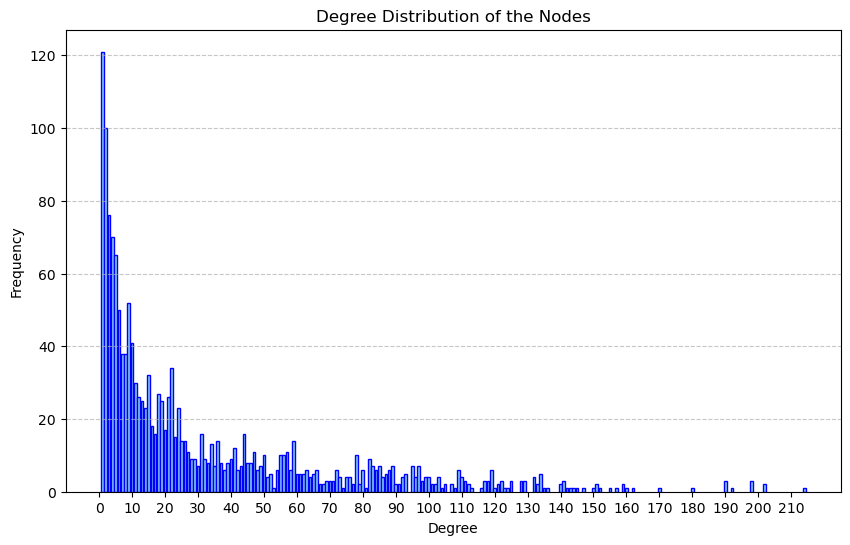

In [103]:

# Calculate degree distribution
degree_sequence = [G.degree(n) for n in G.nodes]
degree_count = {deg: degree_sequence.count(deg) for deg in set(degree_sequence)}
degrees, counts = zip(*sorted(degree_count.items()))

# Plot the degree distribution
plt.figure(figsize=(10, 6))
plt.bar(degrees, counts, width=0.8, color='skyblue', edgecolor='blue')
plt.title("Degree Distribution of the Nodes")
plt.xlabel("Degree")
plt.ylabel("Frequency")

# Set x-ticks every 10
max_degree = max(degrees)
plt.xticks(np.arange(0, max_degree + 1, 10))

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


### THIS IS NOT DONE, IGNORE: Determining structural communities (whilst allowing for overlapping communities) by using the Clique Percolation Method (CPM):

In [85]:
# Parameters for k-clique community detection
k = 3  # Minimum size of cliques

# Detect overlapping communities using k-clique
overlapping_communities = list(k_clique_communities(G, k))

# Print the number of detected communities
print(f"Number of {k}-clique communities: {len(overlapping_communities)}")

# Assign communities to nodes (overlapping memberships)
node_memberships = {}
for idx, community in enumerate(overlapping_communities):
    for node in community:
        node_memberships.setdefault(node, []).append(idx)

# Add overlapping communities as a node attribute
nx.set_node_attributes(G, node_memberships, "overlapping_communities")

# Create a non-overlapping partition approximation
non_overlapping_partition = {}
for community in overlapping_communities:
    for node in community:
        if node not in non_overlapping_partition:
            non_overlapping_partition[node] = community

# Convert to a list of sets for modularity calculation
approx_partition = [set(nodes) for nodes in non_overlapping_partition.values()]

# Calculate modularity
modularity_value = modularity(G, approx_partition)

print(f"Number of {k}-clique communities: {len(overlapping_communities)}")
print(f"Modularity of {k}-clique communities (approximation): {modularity_value:.5f}")

Number of 3-clique communities: 53


NotAPartition: [{'lWLp_ptADNU', 'xNudqMNIlB8', '9zJK2qBcSYs'}, {'lWLp_ptADNU', 'xNudqMNIlB8', '9zJK2qBcSYs'}, {'lWLp_ptADNU', 'xNudqMNIlB8', '9zJK2qBcSYs'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'5U9YyxpcIyo', 'BMJnojCS6yY', '4zWpo9JnzQw', 'UUfVWEB2PDc', '3WcjjIbUj2M', 'casDktujf_Y', 'nyBwTBDJ3jE', 'Oka8KYSZDJA', 'VqJeC6vr_QU', 'QuS3I64tK1s', 'jl98XJmkzf0', 'LxYsOWvrKnc', '4pI8x2QbBBE', 'GhoSLJzFLig', 'Zm_2gtP0NQQ', '85rz_4kxfEo', 'AjPNVRXuGbY', 'ZDsKZqoarLk', '8FMjg6GP4bY', 'v6foD8MElLs', 'ct72jJ_ecSg', 'dD1QK6mkZQM', 'CFHgsVuDXAA', 'rPufCxgYawk', 'YBgjmD3l3xU', 'bLgf6ctxav4', 'jbS7u9sNFMU', 'sLklsX88SVA', 'crbLvp8xzUU', 'k4BuRF6WEtE', '4V5Iw1tXL6U', 'TjarL-23B-8', 'U6bWPk3KT68', 'Vz9vc2LdAgw', 'W8yJHvjbMMU', '_AdsnaT6mME', '7zfF7U3udko', 'gpbQ4A4tQuU', 'VCyko5WJQwg', '3J2ABOfUObs', '1l0Hll1Hd-g', 'p9BK6E_kNJU', 'YpLsnu3cjPU', 'bHkt2EMDog4', 'SbTMlUvOGjU', 'xC9ygh9zxNM', 'm9uXGAesTZ4', 'Q_wVrsX7aqE', '86Xr1FGxugk', 'o4WPI-T_56I', 'RTTCYBS_Z6c', 'pNIjTEw90ds', 'jWQx2f-CErU', 'J8ygxtNsBiI', 'NYxlcQIfBTc', 'oexYI9IGKkM', 'yQjCL87R6vE', 'xxR6Zi1euvc', 'bmccl42eZwM', '1yJtuTgYr5g', '3efwPrjwNVY', 'oEghUy2pG40', 'ugc0vy-Mv1k', '8RabpFhKnuE', '_7ZuqNdDc5Q', 'cLZrJjJOeLw', 'QovI280gr2g', '26yhQcl6FuM', 'EMWnOTUxsjo', 'oJPYygPIvCE', '7G4VqZesvSI', 'RgZSjehyK40', 'pv_JcItk9Js', 'Gxe6279JYaw', 'X9qGnHaJess', 'yqfc3QH7lFI', 'pCoKhBDeY3M', 'w8_NZc-k4yU', 'M0N--JUa74M', '3r9AxtzDLaI', '0x8pI953Rdw', 'esVeg77w8wo', 'MT4kjEMcR9s', 'lQBmZBJCYcY', 'zUHTgAOwulI', 'l_5xEPDmH14', 'Bzt3cVkZNxI', 'fVaJBM8NWzc', 'SxJkGOc4HG0', 'ESLyVm1T_PQ', 'Om0dEWMlCds', '24xXSd-XHNM', 'JFnHc0nerUI', 'wPNHPZwLrUI', 'hWqcC4k26Xg', 'gIyFshmQJ1w', 'rm-4EtvByhA', 'wgvqiH7iCRo', 'xtjPUAsfkVc', '7qZl_5xHoBw', 'voAtjOU7QP4', 'EfcpMzTFY7k', 'lIoROwhuoBM', 'AKtvXC0_xa8', 'Ay51GOuT8no', 'sYI9vt5Io48', 'o7q1_fF6DEY', 'sY4u_bRShDE', 'kCVzhTtX8CQ', 'qhCQCyifYyM', 'BOnz2ZfUE0w', 'FqYMhLrLOyw', 'QOII5CIBm4c', 'gyqKmMC1X-g', 'B57ajjEbRUk', 'iCD-kghhWyo', 'PufEgTAdXm8', 'Oa3Fcu49QZ8', 'FzzIKYjMNnk', 'GG8TyOeTsgc', 'eMk_0svqsnI', 'bWqkqFWo4qs', 's4yS3NYP4-k', 'S8LLmoHrDoA', 'w_Ei8eFuBtM', 'QapcqstY314', 'bxMC3esuJgM', 'V_1845jzP9E', 'Gj6VeX1NyCE', 'VN4BDPZle3A', 'iT8Wzxg7AxY', 'Hh5JHs4j5fI', 'u994_KRYCT0', '9Kr6HOxrz24', 'Kf3Fsz-FB0s', 'XqOuoOZ1Zvg', '0KgVB4t6olE', 'eXfWlCjvlyk', 'AypqJqHUbf4', 'LmkR9WDZ7Sg', 'NrUlydECU-8', 'bq-rXeHGYhI', 'Or4OJl39EjU', 'oQRKj3UI4WI', '0jjtZh_YclA', 'EKO_T6B8JKc', 'hHkVhJ5adKw', '5w1bY-8OIk8', 'UmLu1HC0O3s', '0_IY69Tm3Ts', 'up8Ewui7OnQ', 'Izvcv8XN1qM', 'cV31l_aUxHo', 'f2AhzOJtAbQ', 'SqAGWRpccm0', 'o2YROmFmW7o', 'xDAlxUFAwm8', '3T4gA1-sAzI', 'Byf9sHnFLdo', '8vJ2kWLgUXM', '0NrT1R15mgI', '1RlXJJKpMSo', '8QCTBe9d4UQ', 'HgVtCZbDLwY', '_zhdsLsEdyY', 'rhYRLXHhE0Q', 'PAMdKQu7aPg', '8BH1Klc0c9k', 'zMlUkCazBKM', '_7EKz_rKxAw', 'TibhkHG335w', 'M5Da4i4eMgs', 'fYOa9CONgmk', '2Ibn8fHAdlo', 'YOkuwmLnT50', 'bVOXtB7D3vQ', 'xU7qXxbp2vU', '-k8RjSuPU0c', 'dtNCkbafJW0', 'C-janSUScdY', 'Tn3jfXugpXE', '5ZiUIW-9_Y8', 'N6F7uaoYyDU', 'cPz6l73qhnM', 'fzpCtQuyDHY', 'IBUpV0kIHcM', 'eCetO3I_SzE', '8XfzOwwXRV8', '7U-8B6OSyZ8', 'r3ZAGmbslpg', '_uiAcr2449w', '9NEgr1l5glg', 'sqqmJEneUsI', '0Ccr2i2dWUk', 'Zn2aaayJHF8', 'WR3ah2fFyyI', 'G0khxiHpLns', 'jvnmGEC2qZQ', 'TRt-beCJwAU', 'z9wO4Yqw_RE', 'F5ej-7NFm-g', 'yve0_jVXoh4', 'rZ8cJjgifZE', 'ICLdr5ptxdk', 'GosZtdEOOP0', 'l-GSoTelYcY', 'AryWusm8eFI', '-KLie8X8kZc', 'Q1GQNfR3F0w', 'irkzN3wmVd8', 'yA7CmMzYQ1I', 'Z0nXgxv3zWs', 'WQZzV2RJGro', 'ltxHHZ3iR9w', '6vOm3gWQinQ', '6hd4qzzd6QU', 'G0ySehN2HxI', 'lWLp_ptADNU', 'CUDLZBeWfec', 'LHtKupYssNQ', '9l9rNr8h0fY', 'TYnDbiQ-oao', 'UPSV-z-k-qE', 'd3YUwxtWAVM', '0UlBtzHNCQE', 'xic7-NcN64U', 'lnVmPxQL9fY', '1Lj0vZ21_7M', '9VU7hCCkzKg', 'BW_udmtON3I', 'czKx_5VR8qM', 'Uj1pNpzvk_Q', 'V9awYmT8Sq0', 'I8ZFz7lN1c0', 'tnBY-rCDu9A', 'QRrIWXIuPY8', '4Ul3pSW_79E', 'Y6uHo5eSNVw', 'Lwp0FI-qgxc', 'IbE7peGTpmc', 'BqPNB9Vxl_w', 'd3-EqxcTMp4', 'N739pE1uV0U', 'Cb2AUTqdXII', 'ILmb1FUYnjY', 'EtGAgm_xnbU', '7k9WFrSdkFU', 'u9-n0HtolxM', 'II4sfdRM3Ac', 'uqzCCBcZkRw', 'S1zuY7X8HmE', 'uXg3nsPrrHk', 'D7F42F_JM3U', 'PxOCScALl1M', 'EI-DFEITkvU', 'Zgn1QSzXQx4', 'zdnG0BWNh6o', 'D6VPcQ1Braw', 'Qu8mdniJ1Q8', 'DC-8_m938Ho', 'dTzAiNkNv88', 'hBMoPUAeLnY', 'OZytLLasceA', 'unhCDyJFMvM', 'axD49xGzKWY', 'Zq72ILc1IzQ', 'KXFuNaYBmyo', 'nTD1v5t2sJc', 'LGufgkwaIWs', 'U2VFpufsxMk', 'DzUTFI431T4', 'pOAzzX44XSk', '_7djFt3SIt0', 'qfJgl0gZz4w', 'i6IOiUi6IYY', 'ywMCtCtOmoI', 'hg-CTJzpWoI', 'Wh0pRExTL80', 'WRYqy5WdR88', 'kiF9lTtzhI4', 'nEOvo0KC1bk', 'eXui9hx8MjI', 'x2MEOdYiBmk', 'wdNhtZOGxBw', 'bKjfw77cxeQ', 'tL-N5yUPZxI', 'trRrCpsT0Eo', 'DIWsSpvHj8o', 'n12Qn-kaSbo', 'N6vgnL2xJj4', 'oQYeLa-YiSE', 'WffKPOOcEiw', '7g3tiDULX8I', 'lNc1N_OSFI8', 'hwE4M3DIOTk', 'zxK3t_mKKT0', 'Ba2BQeDlOO0', 'd49PAIcEPNs', 'uQbnPh9tbwo', 'oE0jGkpgriM', 'c0W1pxifnqU', 'EaIeEfZNCr4', 'sOA5djMIcic', 'ekr2nIex040', 'Lh_nwGSVJKs', 'hLnoZzSnd44', 'rlX7QlmQkY0', '6SVOu_tCV1o', 'EKo1eZ9juxA', 'T7JALER7rmw', 'etXgiD6d5RA', 'tnSnTCw4Ljw', 'G0Q0NbT0j5Q', 'RQT0QKNs3mA', '-DHCe8baaF0', 'aIyQWbgXzUQ', 'oO-6WFNbaxM', 'wQ9OrESAvRk', 'OXtGn96u49k', 'Tnhk24VIaBQ', 'tHl7x4DZ3RI', '4OQfHH0TVpk', 'JMh4bm--nPA', 'OefETHJ0wzE', 'BRXPNCuGVvM', 'Q10_srZ-pbs', 'p3kJOuNnkJg', 'bTLGbkzfmOE', 'WV0e41tPQDI', '2bJkcsCeiCs', 'j0ihsNlYldc', '5ADUY-yLvJ8', 'guHnmL-Giyo', 'iNdvcVQ2FQM', 'ialgRAC-cns', 'KyhA6JGYK0g', 'NTwRfdGzl14', '4nl7aqThf4E', 'wWTCQbq_vjk', 'xscbvKgdgQk', '2dHxYZ9iZ2A', 'zI_5QU1Fe3E', 'OK4rJs9FdqE', '8cpQod30DuA', 'ExuiWLIyR8A', 'J5GzSrhlOnA', 'iSgCRVjiUhg', 'e_tBQowOBv0', 'fe2QAY6uPME', 'ByxJE9z313s', '_-T2szCFElc', 'a3ZTE_WV7m0', 'bvYp7ORMVrs', 'ZHTnsIGKyCs', 'vyxgK-KXztw', '7Hmk82v-eNM', 'aH4ADJaySxc', 'fnPxkuFIA48', '03GtvGWdxPc', 'y7C7PYaMS7w', 'wSog4QCQwrw', 'pUWGm8ucYgs', 'NVXYzO6paNo', '_CZ7YXKyKGA', '9qI0LTmSr38', 'vLkzOqyba7Q', '1XCuP0Un-nk', 'rQqFvztD18g', 'k-75gOf0RSQ', 'zyFqJU54wqE', 'lQrDEBSXboc', 'a5Q9v0cGDlY', '6BMKx4sQ2o8', 'JkLHsE-BpUg', 'eUgPft1Qb30', 'UfzZX4y_Gkw', 'FzZ6GFtxeis', '-rbrLdEvD2c', 'TXYcyYSoknw', '-LwTSTidWQQ', '_6yuXxFEUT8', 'pWu4BW9DKGw', 'dRrTj0x8Td4', 'Edzi4fEEqLc', 'tsXboxjDB3Y', 'Cf0qL5logVk', 'CUJ-e2zC-zA', 'cdIEC6_AkJ0', 'Oha2UjAhjWc', 'iM3VfUpTh9c', 'bGJbaduTl20', '4xJzRowfeNc', 'fsA0GODFFJs', 'ZvewzmHAaRk', 'r0oasQkLYN8', '3kWI2EWyUa0', 'ADvBEA4f1Q8', 'R8OqqaBwcl8', 'A_25Ak4qtzw', '9723WMQHZ68', '__3jBcOGuSc', 'hXqrA_4zUUU', 'WKSipcnHFNo', 'yvr4U1sF1P0', '1wu9t99hnpI', 'hrVpyb-I_PQ', 'rVA-UoZoOv0', 'dnPvPYNiP-I', 'qDFxezKHW68', 'xOOHevgeNu8', 'taE4wnmDHhU', 'YHum5LPPQWI', 'zUEBQyiRJJA', 'BHdoH-PM7rQ', 'l3TaFlJmv6w', 'BfMkfNhEi_o', 'G0yQftDmD_Q', '9QXxid7t9oM', 'r93hYOOumhw', 'xjfqFG2CuIg', '_GOFWTdxaTM', 'jMZ8eYe3zio', '9Msqyy-b7Zo', 'DQ5EeImWYaI', '8oC50pKc6Vc', '4uVzJdim_LY', '67WbR7MOlVg', 'TuW2XmZanRE', 'XbQ4HAz_v3k', 'AP1QYUzulkY', 'xjv8tqdyoR0', 'ig4nHVhL-rE', 'AohuGOLds50', 'mdCVduFbIlY', 'k7aLNa2gwIE', 'GNVQOi5PhYY', 'oP59jg-J2ys', 'ik8HYhXU8nY', 'QCTrim2LjTY', 'W4U6aZV-EX0', 'KdfSPXzx2r4', 'aROYr89fUHo', 'ltQ79662j6c', 'BvpEAfTN7fk', '5r5UePOgMQU', 'yf7Kxw-3RS0', 'wua1enw2cSQ', 'jg4mZak7wzQ', 'TRQJwstfLNk', 'rUP1ctvx8lI', 'tV387AcVcGY', 'wE6Z8XtdXm8', 'VpOiYtwo4iw', 'gQ_4p8rvR7s', 'EIOlguavasQ', '-R5sYFmekeI', '-gFiqG9bf58', 'MDWvfD5nbyI', 'RYkFycOTwoc', '_GZkiRzkQjY', 'Hf9pXbnWIK8', 'fCn3QkH0xro', 'OiSq_yPX_dc', 'mChZKP18rQA', 'e5anp1KPBkg', 'FV0-IzASs9o', 'CRVe1tzu_Yo', 'B9P3rjTOq4M', 'SST2O2VBOGk', 'nVIHHcNfszw', 'oQ-kNLbPy40', '4yre2b_0110', 'yIIMu36utyo', 'dtXsgpZOUkg', 'rUdwTISGb60', 'kH2GCoRFf-A', 'bF0xQti1sA4', 'gXCCiVqI_VQ', 'pKMM344Y2B8', 'u1i2tbObVXg', 'lSoeBoVuySc', 'reDlN6dbeCw', 'dZhBY8_3Rm0', 'QNuRfdmYCks', 'Q3woJb3ZxnA', '40nT_rPxZac', 'GNHY0s3IlA4', '6ErUQehwucY', 'dKUfMkUWNqg', 'PaQTELEqaEc', '6MeIFxun2uA', 'tblmOTTYl4s', 'jkn91eZu1jk', 'T-vLGMlfioE', '9FIjIQbkTTY', 'ruS0vy3aIe0', 'bB3-CUMERIU', 'uT9s4BXcv6w', 'SkNc_cNdXCU', 'DCVNDnRzkco', 'SuwPaNAZlF0', 'in7CBMrJSII', 'iwEAK5wsWLg', 'qvBh-uFrt48', '6bzKMPPPvKg', 'knxGfF4mOSM', 'OkfKZYeTbKM', 'v0vreNGX20Q', 'aWCycIICI9A', 'ScRGVhBBqM8', '-dB6bxEnoms', 'lhonUEfSfWc', 'QdgNthrRaHo', 'fKOUVuBnGqQ', 'mjZhaCDyMzo', 'xTIr-ZcGPVc', 'AnbESSif_Zg', 'Md4TuCOr8So', 'zB_OApdxcno', '7QYGRXEdWfg', 'gyn1lurBVUs', 'NtU2GzCZk5I', 'aIwIB1plZO8', 'B4KtqJ9LgEE', 'czSWtbtX7hc', '2tmT-yveGeY', '0mJsAhz_cL8', 'JBO-J2K1q5w', 'gPzFig_hqGE', '4srO0OxPqlA', '2xrOO4hvFhE', 'qD_ZJrp2d-w', 'igSNfQZI_vg', 'kCtUe_Ypvok', 'EOEGxRWUD5U', 'toKRvpVHutM', 'YTLU9Bc_fNM', 'i8YnkkBHMmA', 'W0lEAdLL0qE', 'riBQLz2tpSM', 'dj_b8LvgiBE', 'M1lAm1Qp4kg', 'yWPkavqf3n0', 'tw-0M2QTkvo', 'fH7SutKHLEk', 'gvru2mgWUwI', 'jxQi7525h4o', 'yA3wXBK_TSo', 'dHT3aodTfAE', '9KfL3_owE2o', 'Vcg54Fbk8yE', 'jHmQ7-6eyP8', 'cOGPBLhCe8g', 'OLA-swlxafA', 'RMprlMfsHAU', 'mQnBctuwa70', '6TZulKJTVUU', 'ZOpLlT0vRxQ', 'GjCTuTI6gYg', 'E5nrI9LqKMw', 'HdamkHbJlnI', 'IuR8M2aJ8gg', 'X-RNj6Sh2K8', '1KBp5dd6heU', '9zJK2qBcSYs', 'MesWtDPzFLA', '5c0_u9PsrsQ', 'lHodTkj7ou0', 'hfXvuKCZXOQ', 'rexfoQ17fTc', '_4jAK2PnsWA', '3w6uJrGrEPs', 'vWW3eEzrhsM', 'eJbGOWv-rHk', '06RczsykEig', 'QozAb4MuXng', 'MtL7Dn0DvkQ', '-AIVJC6_xh0', 'ETPU2RY_aCY', '1Ml5XSCcM1A', 'rQJj1-i8KDA', '-9r-8Lu4ttQ', 'vl7aKyhhVAk', 'IVhRjzxDfsI', 'Bn2NmOOmOkg', '0Hpuz2TV094', 'zfHFpSSnD74', 'JfBKQ-Sex_Y', 'pS0Y9llD5Gs', '9Z7A-nJHccs', '2dIuzSTS6Qk', 'w9jLWb6SkjU', 'XRNmanP-ir4', '20Syj8-dJnA', 'hw5jX6jl2Xk', 'J19rkycRi3I', '4eCtiZHrmGE', 'ZC-egC-ElAU', '9qlMn5Q68JI', 'arI5gbmwbLM', 'ZPPB4237gwM', 'tZzRJHw4cdg', 'xqg2s5969aM', 'qcD78WCsd3g', 'KniYH5SqSwQ', 'vMaGSRGOyUQ', 'sAWi-eyXuzw', 'WvMfkc_uLmA', 'Wf3ilwKPLHM', 'EJInP72F4W4', 'E_amP-g_s-8', 'U3g4EftyCAg', 'eAbzE5AxTj8', 'QvCR2leJUTY', 'pZ9sgHCrJZw', '-4Q8Tar4vk4', '3ae_c0va3WY', 'Ht4qlDNgMHE', 'AunMoBN0i4o', '5xMI-F1kDnQ', '6uwc0GbJNcE', 'ltfmFFQk9-4', 'n7syVP5ruLc', 'HYyVoGqMtQQ', 'gbxJT-yBdcs', 'Kr87P-6N13I', 'Xe1NZmCP2mI', '0Z0y3S8xWQM', 'ysQUkLKFW8U', 'ODnWg5_u51g', 'T9I3HNK_WYY', 'iWMkjaw6IBc', 'qKlHYBTR4I0', 'E6ZRrJtZ4nE', 'FL1p5TgByB0', 'b__vp69NTqM', 'PnFY9jgLb9s', 'v9jMWjpqLO8', 'CHAJ5KVanOQ', 'q31HGLVBObs', '0y0P9dYUvLE', 'R3Gc6c08gHA', 'BvtpT0KjvVI', 'UJanRCMWBtE', 'emMb5znqdd4', 'c3TIjGFzr6Q', 'pUBZf35xMNA', 'IyoMlbDh9_E', 'xkszkw6QxLQ', '9bM-Ir13TPQ', 'KANGsPREU6Q', 'vCFDbNgnebc', 'ifDIyQ5qlzA', 'P2tGHeBWoAI', 'e0mHVk8-wX4', 'KnlJXINemyU', 'LoZuQpq9CCs', 'AAyCh3IWlN4', 'KHbPL6VBk9E', 'dZm785SS8OM', 'eGMULDZpZws', 'D3XTHSWzHTI', '8SHidyhsm9U', 'z79IbVHwVoY', 'BbO00FHHF8E', 'DQ5sNcR5j5A', 'xS74WfaGzHA', 'INXqYpenYe8', 'rPE78wwPWSI', 'icZZQNXNbMY', 'qO_jEGLLw0w', 'Sz538Et1uJA', 'Wxt3RmRuT4o', 'PXDvSfeyFrA', 'cBnAYfsKm1Q', 'qYPFu9AEztc', 'tDtM5FtzNn8', 'msfn3T1c3bA', 'Exw8KzuVOvg', 'gUgtKFoJTa4', 'BPhYTGNhsg4', 'VC6vOkV0MlM', 'dn2XZVJrpIY', '81Vvkp8RCTE', '4Y1nD6U3eWI', 'KUx9nLFIXK4', 'CTmTOLvSSKk', 'Jczt0xPAyMY', 'zEA4-xu4pT4', 'vtvAdHPH170', 'i9eI9Hcwc4s', 's_xqm1boQjY', 'ZGL1FfH78b4', 'ioTNBETs2Lw', '_ymicn0_GYc', 'Wl88OWKiJQA', '8sHp3ZQ-wNg', 'gKTTpVU-3GI', 'cWCX3O3fU2o', 'iyhflfqrSiE', 'v0ZbzyxS6Ew', 'BF7rYuj9Ehk', 'Xw9ETCKhUwg', 'K4fO-fBajD4', '63nEVOQFA9I', 'gkIVVrcMi0o', 'frI6sbDCJpQ', 'Tnvsh3ngSBs', 'WhLVHs04C-U', '1sFLfFCnGgk', '7RIvq98nXvc', 'pLDuAhiSZ6Y', 'BrGl81E4ZOc', '8musHuA2bCs', 'm93fDEb3lo0', 'WdwZXlxfp6Q', 'nb42P2EDReg', 'XKKqvFSig1U', 'UIXFXmWmxMQ', 'myNgcqCGwwE', 'MRJjDA5GtzQ', 'cIDzFm90cVA', '6_SsGMeJIHk', 'mdoWHAuXK0I', 'phpronPZkUg', 'SCUQfIDE5R0', 'Tma0hn296vY', 'x4gXWnJYNLk', 'MkNg-EcAuKM', 'xtknOL99oDM', '2L23AgG-up0', 'XGGXlj6grzQ', 'TS2O-dyYCno', '1YYUoRy6kYA', 'c6JD3mmIP64', 'ag0zOJCMnBY', 'XJsfzvv8ubQ', 'vWsgTlpRfSE', 'lh9b4LacRq4', 'NKod-7fhiis', '36gdgZ163YM', 'BulfNBp1i9U', 'xI78YbUSoK4', 'sFQAxcs1Mq8', 'A4ch-olIuZo', 'VN_KgZ9Cbbs', 'ujrp8IzM6XQ', 'Z7R2Of1oBkw', 'P2z1W-I5Kmo', 'Rk1heS_3vkQ', 'WrVBpZ5IuSE', 'IJS-81ZQFIc', 'MwfIA909Z7I', 'ZOVrTTmyt4E', 'cz7-PcFtaBg'}, {'-YogzG3qrxE', 'ILmb1FUYnjY', '9AKd-1XuQSU'}, {'-YogzG3qrxE', 'ILmb1FUYnjY', '9AKd-1XuQSU'}, {'aIyQWbgXzUQ', 'Kf3Fsz-FB0s', '1zih_fI_QsQ', 'PdDJEwLZkkE'}, {'aIyQWbgXzUQ', 'Kf3Fsz-FB0s', '1zih_fI_QsQ', 'PdDJEwLZkkE'}, {'kblGAgspVo0', 'WQZzV2RJGro', 'F3UVBS1V3U4', 'Bzt3cVkZNxI', 'IbE7peGTpmc', '4pI8x2QbBBE', 'ik8HYhXU8nY', '_ymicn0_GYc', 'GNyembSi1nw', '5mN2JBsh9FQ', '54YpK2I6BM8'}, {'kblGAgspVo0', 'WQZzV2RJGro', 'F3UVBS1V3U4', 'Bzt3cVkZNxI', 'IbE7peGTpmc', '4pI8x2QbBBE', 'ik8HYhXU8nY', '_ymicn0_GYc', 'GNyembSi1nw', '5mN2JBsh9FQ', '54YpK2I6BM8'}, {'kblGAgspVo0', 'WQZzV2RJGro', 'F3UVBS1V3U4', 'Bzt3cVkZNxI', 'IbE7peGTpmc', '4pI8x2QbBBE', 'ik8HYhXU8nY', '_ymicn0_GYc', 'GNyembSi1nw', '5mN2JBsh9FQ', '54YpK2I6BM8'}, {'kblGAgspVo0', 'WQZzV2RJGro', 'F3UVBS1V3U4', 'Bzt3cVkZNxI', 'IbE7peGTpmc', '4pI8x2QbBBE', 'ik8HYhXU8nY', '_ymicn0_GYc', 'GNyembSi1nw', '5mN2JBsh9FQ', '54YpK2I6BM8'}, {'kblGAgspVo0', 'WQZzV2RJGro', 'F3UVBS1V3U4', 'Bzt3cVkZNxI', 'IbE7peGTpmc', '4pI8x2QbBBE', 'ik8HYhXU8nY', '_ymicn0_GYc', 'GNyembSi1nw', '5mN2JBsh9FQ', '54YpK2I6BM8'}, {'Tn3jfXugpXE', 'By6YYRUyVAk', '6bzKMPPPvKg', 'jckyvd6IKhk', 'guHnmL-Giyo', 'ct72jJ_ecSg'}, {'Tn3jfXugpXE', 'By6YYRUyVAk', '6bzKMPPPvKg', 'jckyvd6IKhk', 'guHnmL-Giyo', 'ct72jJ_ecSg'}, {'N6Y6rB28YvE', 'm-9XvB11NKw', 'E8yKXx-6bPI'}, {'N6Y6rB28YvE', 'm-9XvB11NKw', 'E8yKXx-6bPI'}, {'N6Y6rB28YvE', 'm-9XvB11NKw', 'E8yKXx-6bPI'}, {'4K3GAmGxHCQ', 'DS4IIq8KWo8', 'en70NGHHr6E', 'JsXPysZjhUw', 'JUR0UpXDiRE', 'Tz6J5B0as2Y', 'z0keQBT2sbw'}, {'4K3GAmGxHCQ', 'DS4IIq8KWo8', 'en70NGHHr6E', 'JsXPysZjhUw', 'JUR0UpXDiRE', 'Tz6J5B0as2Y', 'z0keQBT2sbw'}, {'4K3GAmGxHCQ', 'DS4IIq8KWo8', 'en70NGHHr6E', 'JsXPysZjhUw', 'JUR0UpXDiRE', 'Tz6J5B0as2Y', 'z0keQBT2sbw'}, {'4K3GAmGxHCQ', 'DS4IIq8KWo8', 'en70NGHHr6E', 'JsXPysZjhUw', 'JUR0UpXDiRE', 'Tz6J5B0as2Y', 'z0keQBT2sbw'}, {'4K3GAmGxHCQ', 'DS4IIq8KWo8', 'en70NGHHr6E', 'JsXPysZjhUw', 'JUR0UpXDiRE', 'Tz6J5B0as2Y', 'z0keQBT2sbw'}, {'4K3GAmGxHCQ', 'DS4IIq8KWo8', 'en70NGHHr6E', 'JsXPysZjhUw', 'JUR0UpXDiRE', 'Tz6J5B0as2Y', 'z0keQBT2sbw'}, {'4K3GAmGxHCQ', 'DS4IIq8KWo8', 'en70NGHHr6E', 'JsXPysZjhUw', 'JUR0UpXDiRE', 'Tz6J5B0as2Y', 'z0keQBT2sbw'}, {'SRUA4YOn8ks', 'BvaMBE_B5A0', 'Oha2UjAhjWc', 'fmC6b6_ovZY', 'Sih0v01Wbek', '8ypetyyf-rQ'}, {'SRUA4YOn8ks', 'BvaMBE_B5A0', 'Oha2UjAhjWc', 'fmC6b6_ovZY', 'Sih0v01Wbek', '8ypetyyf-rQ'}, {'SRUA4YOn8ks', 'BvaMBE_B5A0', 'Oha2UjAhjWc', 'fmC6b6_ovZY', 'Sih0v01Wbek', '8ypetyyf-rQ'}, {'SRUA4YOn8ks', 'BvaMBE_B5A0', 'Oha2UjAhjWc', 'fmC6b6_ovZY', 'Sih0v01Wbek', '8ypetyyf-rQ'}, {'SRUA4YOn8ks', 'BvaMBE_B5A0', 'Oha2UjAhjWc', 'fmC6b6_ovZY', 'Sih0v01Wbek', '8ypetyyf-rQ'}, {'I2FNFrDjoSA', 'x31oKKSx6f0', 'HucoYR50V3Y', 'dgwfDUwyl-o', 'tIhQSUdfA-Y'}, {'I2FNFrDjoSA', 'x31oKKSx6f0', 'HucoYR50V3Y', 'dgwfDUwyl-o', 'tIhQSUdfA-Y'}, {'I2FNFrDjoSA', 'x31oKKSx6f0', 'HucoYR50V3Y', 'dgwfDUwyl-o', 'tIhQSUdfA-Y'}, {'I2FNFrDjoSA', 'x31oKKSx6f0', 'HucoYR50V3Y', 'dgwfDUwyl-o', 'tIhQSUdfA-Y'}, {'I2FNFrDjoSA', 'x31oKKSx6f0', 'HucoYR50V3Y', 'dgwfDUwyl-o', 'tIhQSUdfA-Y'}, {'EH1_UqlmAYE', 'Z7R2Of1oBkw', 'EbBJ6YAXzxQ', 'ADvBEA4f1Q8', 'JMh4bm--nPA'}, {'EH1_UqlmAYE', 'Z7R2Of1oBkw', 'EbBJ6YAXzxQ', 'ADvBEA4f1Q8', 'JMh4bm--nPA'}, {'KuwDjVaGctI', 'TvFqT07ZWn4', 'YINIBJ5v7Yo'}, {'KuwDjVaGctI', 'TvFqT07ZWn4', 'YINIBJ5v7Yo'}, {'KuwDjVaGctI', 'TvFqT07ZWn4', 'YINIBJ5v7Yo'}, {'wdNhtZOGxBw', 'QtxuCUMjwQE', 'fnPxkuFIA48', 'SST2O2VBOGk'}, {'tpfuOL1-GcE', 'jf79cWFggNw', '7wfHRpnbDC8', 'xscbvKgdgQk'}, {'tpfuOL1-GcE', 'jf79cWFggNw', '7wfHRpnbDC8', 'xscbvKgdgQk'}, {'tpfuOL1-GcE', 'jf79cWFggNw', '7wfHRpnbDC8', 'xscbvKgdgQk'}, {'gl-ToOgx76w', '6-lBbkXfL-k', 'IZSSQHrAqas'}, {'gl-ToOgx76w', '6-lBbkXfL-k', 'IZSSQHrAqas'}, {'gl-ToOgx76w', '6-lBbkXfL-k', 'IZSSQHrAqas'}, {'By6YYRUyVAk', 'Bu5ewZM8Qrc', 'qSOvh4GJO18'}, {'By6YYRUyVAk', 'Bu5ewZM8Qrc', 'qSOvh4GJO18'}, {'GajGrj7HLQM', '5A7Ns3G1DOc', '4g-vh2zw93w'}, {'GajGrj7HLQM', '5A7Ns3G1DOc', '4g-vh2zw93w'}, {'GajGrj7HLQM', '5A7Ns3G1DOc', '4g-vh2zw93w'}, {'24xXSd-XHNM', 'G3uvDKVE79U', 'xscbvKgdgQk'}, {'ybQi03ELKJU', 'nWPzhPcE4Vw', 'JEn4EFNKi4o', 'UPU160urfmI', 'JG3Ajf7r6Ic', 'KEnICcS1Xjw'}, {'ybQi03ELKJU', 'nWPzhPcE4Vw', 'JEn4EFNKi4o', 'UPU160urfmI', 'JG3Ajf7r6Ic', 'KEnICcS1Xjw'}, {'ybQi03ELKJU', 'nWPzhPcE4Vw', 'JEn4EFNKi4o', 'UPU160urfmI', 'JG3Ajf7r6Ic', 'KEnICcS1Xjw'}, {'ybQi03ELKJU', 'nWPzhPcE4Vw', 'JEn4EFNKi4o', 'UPU160urfmI', 'JG3Ajf7r6Ic', 'KEnICcS1Xjw'}, {'ybQi03ELKJU', 'nWPzhPcE4Vw', 'JEn4EFNKi4o', 'UPU160urfmI', 'JG3Ajf7r6Ic', 'KEnICcS1Xjw'}, {'ybQi03ELKJU', 'nWPzhPcE4Vw', 'JEn4EFNKi4o', 'UPU160urfmI', 'JG3Ajf7r6Ic', 'KEnICcS1Xjw'}, {'Zp-Jhuhq0bQ', 'o0oW3lPoOXM', 'frV8cZ_yA_4', 'cxhqqpVk65Q'}, {'Zp-Jhuhq0bQ', 'o0oW3lPoOXM', 'frV8cZ_yA_4', 'cxhqqpVk65Q'}, {'Zp-Jhuhq0bQ', 'o0oW3lPoOXM', 'frV8cZ_yA_4', 'cxhqqpVk65Q'}, {'Zp-Jhuhq0bQ', 'o0oW3lPoOXM', 'frV8cZ_yA_4', 'cxhqqpVk65Q'}, {'lVZTKtP4ahU', '6bzKMPPPvKg', 'BF7rYuj9Ehk'}, {'rlX7QlmQkY0', 'tELMsh5e4is', '3T4gA1-sAzI'}, {'ZV3SCXIIXEc', 'VgcBPVXRUW8', 'ZnkXU3MJqtQ'}, {'ZV3SCXIIXEc', 'VgcBPVXRUW8', 'ZnkXU3MJqtQ'}, {'ZV3SCXIIXEc', 'VgcBPVXRUW8', 'ZnkXU3MJqtQ'}, {'u9-n0HtolxM', '1rYKJAa7_Vs', '0SCyB3dIanI'}, {'u9-n0HtolxM', '1rYKJAa7_Vs', '0SCyB3dIanI'}, {'JX0LxLUoI_M', 'sqqmJEneUsI', 'jckyvd6IKhk'}, {'mddOh9bscwY', 'R_YIKCFvPn4', 'h7GMBRVPRGk', 'z-K3WkyGEN4'}, {'mddOh9bscwY', 'R_YIKCFvPn4', 'h7GMBRVPRGk', 'z-K3WkyGEN4'}, {'mddOh9bscwY', 'R_YIKCFvPn4', 'h7GMBRVPRGk', 'z-K3WkyGEN4'}, {'mddOh9bscwY', 'R_YIKCFvPn4', 'h7GMBRVPRGk', 'z-K3WkyGEN4'}, {'uqzCCBcZkRw', 'AypqJqHUbf4', 'aJAvswiOihQ'}, {'MKXvSe4vv-w', 'J19rkycRi3I', 'L4GRt-MM83Y'}, {'MKXvSe4vv-w', 'J19rkycRi3I', 'L4GRt-MM83Y'}, {'4_ubL2ZiBKE', 'cBnAYfsKm1Q', 'ILZ-QtGaSCQ'}, {'4_ubL2ZiBKE', 'cBnAYfsKm1Q', 'ILZ-QtGaSCQ'}, {'JG3Ajf7r6Ic', 'NBCaVfIosBc', 'qZucCUrAma8', 'PBDuFqu4y8E', 'uXg3nsPrrHk', '3sEqHTBu3uI'}, {'JG3Ajf7r6Ic', 'NBCaVfIosBc', 'qZucCUrAma8', 'PBDuFqu4y8E', 'uXg3nsPrrHk', '3sEqHTBu3uI'}, {'JG3Ajf7r6Ic', 'NBCaVfIosBc', 'qZucCUrAma8', 'PBDuFqu4y8E', 'uXg3nsPrrHk', '3sEqHTBu3uI'}, {'JG3Ajf7r6Ic', 'NBCaVfIosBc', 'qZucCUrAma8', 'PBDuFqu4y8E', 'uXg3nsPrrHk', '3sEqHTBu3uI'}, {'0Mzx86A2ddg', 'hrVpyb-I_PQ', 'DO_iGu_U9xo'}, {'0Mzx86A2ddg', 'hrVpyb-I_PQ', 'DO_iGu_U9xo'}, {'DzUTFI431T4', 'B8BIVEdRcc4', 'FzZ6GFtxeis'}, {'n4SPOo1FyG0', 'z4MY4fDJTbI', 'vl7aKyhhVAk'}, {'n4SPOo1FyG0', 'z4MY4fDJTbI', 'vl7aKyhhVAk'}, {'eB8-7IO92Ew', 'VN_KgZ9Cbbs', 'mdCVduFbIlY', '9l9rNr8h0fY'}, {'gJd7IMYqCYE', 'N739pE1uV0U', 'BqPNB9Vxl_w'}, {'3MNCN17IcH8', 'sfLkqk5qay0', 'J5cCMwfkhx4', 'yA3wXBK_TSo'}, {'3MNCN17IcH8', 'sfLkqk5qay0', 'J5cCMwfkhx4', 'yA3wXBK_TSo'}, {'3MNCN17IcH8', 'sfLkqk5qay0', 'J5cCMwfkhx4', 'yA3wXBK_TSo'}, {'xpbxc89KP34', 'bHkt2EMDog4', 'tL-N5yUPZxI'}, {'WffKPOOcEiw', 'y38qQRg3UDI', 'NKod-7fhiis'}, {'EKe_CVJwT5o', 'cBnAYfsKm1Q', 'oLgwa0Us7-8'}, {'EKe_CVJwT5o', 'cBnAYfsKm1Q', 'oLgwa0Us7-8'}, {'JVhnqVrTJ2U', 'zlmQ5aGf2pA', 'G_CR2HCnLQ4'}, {'JVhnqVrTJ2U', 'zlmQ5aGf2pA', 'G_CR2HCnLQ4'}, {'JVhnqVrTJ2U', 'zlmQ5aGf2pA', 'G_CR2HCnLQ4'}, {'yRSpeXjk_mg', 'HYyVoGqMtQQ', 'E_amP-g_s-8'}, {'0Z0y3S8xWQM', 'AohuGOLds50', 'jaLr5kRnJg8'}, {'B0pW_zEKRI4', 'qSOvh4GJO18', '50oXhB5tr1o'}, {'B0pW_zEKRI4', 'qSOvh4GJO18', '50oXhB5tr1o'}, {'2kjolTLZ_Mg', 'BvaMBE_B5A0', 'queBWT_e10o'}, {'2kjolTLZ_Mg', 'BvaMBE_B5A0', 'queBWT_e10o'}, {'6MeIFxun2uA', '10Gxu8N59dk', 'm6LyUXtIqJE'}, {'6MeIFxun2uA', '10Gxu8N59dk', 'm6LyUXtIqJE'}, {'UXfvGD0ZuYg', 'zY7PzUFxS-s', 'g-UCIpv2uc4'}, {'UXfvGD0ZuYg', 'zY7PzUFxS-s', 'g-UCIpv2uc4'}, {'UXfvGD0ZuYg', 'zY7PzUFxS-s', 'g-UCIpv2uc4'}, {'Bz6dKEW1PSY', '_aR06MMrm4w', '93f4Bf6o4Cw'}, {'Bz6dKEW1PSY', '_aR06MMrm4w', '93f4Bf6o4Cw'}, {'Bz6dKEW1PSY', '_aR06MMrm4w', '93f4Bf6o4Cw'}, {'PWjZ3p1jNho', '80SH8Z_DOnY', '5NPe8_gDSr4'}, {'PWjZ3p1jNho', '80SH8Z_DOnY', '5NPe8_gDSr4'}, {'PWjZ3p1jNho', '80SH8Z_DOnY', '5NPe8_gDSr4'}] is not a valid partition of the graph Graph with 974 nodes and 9975 edges

## OLD CODE THAT WE DONT USE ANYMORE:

Printing the info from one video to check if everything has been stored correctly:

In [7]:
# Choose a specific node (replace 'node_name' with the actual node name you want to inspect)
node_name = "_7djFt3SIt0"

if node_name in G.nodes:
    print(f"Attributes of node '{node_name}':")
    for key, value in G.nodes[node_name].items():
        print(f"  {key}: {value}")
else:
    print(f"Node '{node_name}' not found in the graph.")

Attributes of node '_7djFt3SIt0':
  comments: ✔ Did you subscribe to 𝗫𝗛𝗘𝗡𝗦𝗜𝗟𝗔 𝗠𝗬𝗥𝗧𝗘𝗭𝗔𝗝's Official channel? 👇🏼
►  https://smarturl.it/SubXhensilaMyrtezaj
🎧 Listen on Spotify / Download on iTunes 👇🏼
► https://music.fole.to/XhensilaElinelAekeprovu
Kont Faleman Morys is totoration.
Give heart you are the star 🌟🌟🌟🌟🌟je Star
Every song of yours is Superime Only your songs listen to
She has a beautiful face and body. Her energy is so exotic. 🫶🏼
But her “dance and move” is comedic. Not a good actress for her own production. 🫥 She needs to have personal assistant to make up the movements for her videos.
2000s
Fails
How much one thing I do.
Who thinks this is in vain song of Gensiel total failure 😏😏
Is Gensila or Snow?
shake she shakes Jenny
❤🎉❤❤view beautiful
Has Copy Dafina Zeqiri to scene with identical newspapers
Turp tet vij my femer by you is nen
Delete how much you are in time let nam
World Star Gesila with these outfits good at all 1 star as you are bare I bare my values ​​❤
I love you❤❤❤

Ensure that all node-json files have a list as a country attibute (not a string):

In [70]:
import os
import json

# Folder containing the node JSON files
node_files_folder = "node_files"

# Iterate over all JSON files in the folder
for filename in os.listdir(node_files_folder):
    if filename.endswith(".json"):
        file_path = os.path.join(node_files_folder, filename)
        
        # Load the JSON file
        with open(file_path, "r", encoding="utf-8") as f:
            node_data = json.load(f)
        
        # Check if 'country' exists and ensure it is a list
        if "country" in node_data:
            if isinstance(node_data["country"], str):
                # Convert string to list
                node_data["country"] = [node_data["country"]]
                print(f"Updated 'country' in {filename} to a list.")
            elif not isinstance(node_data["country"], list):
                # Handle unexpected non-list and non-string types
                print(f"Unexpected type for 'country' in {filename}: {type(node_data['country'])}")
                node_data["country"] = []
        
        # Save the updated JSON back to the file
        with open(file_path, "w", encoding="utf-8") as f:
            json.dump(node_data, f, ensure_ascii=False, indent=4)

print("Finished updating all node JSON files.")


Finished updating all node JSON files.


Inspecting the json files for attributes to understand:

In [ ]:
import os
import json

# Path to the folder with JSON files
json_folder = "complete"

# List JSON files in the folder
json_files = [file for file in os.listdir(json_folder) if file.endswith('.json')]

# Inspect the first JSON file
if json_files:
    first_json_file = os.path.join(json_folder, json_files[0])
    with open(first_json_file, 'r', encoding='utf-8') as f:
        data = json.load(f)

    # Check if it's a list or dictionary
    if isinstance(data, dict):
        print("Top-level keys in the JSON file:")
        print(data.keys())
        for key, value in data.items():
            if isinstance(value, dict):
                print(f"Nested keys in '{key}': {value.keys()}")
            elif isinstance(value, list) and len(value) > 0 and isinstance(value[0], dict):
                print(f"Keys in the first element of list '{key}': {value[0].keys()}")
            else:
                print(f"Key '{key}' contains data of type: {type(value)}")
    elif isinstance(data, list):
        print("JSON contains a list. Keys of the first element:")
        print(data[0].keys())
        for key, value in data[0].items():
            if isinstance(value, dict):
                print(f"Nested keys in '{key}': {value.keys()}")
            elif isinstance(value, list) and len(value) > 0 and isinstance(value[0], dict):
                print(f"Keys in the first element of list '{key}': {value[0].keys()}")
            else:
                print(f"Key '{key}' contains data of type: {type(value)}")
    else:
        print("Unexpected JSON structure:", type(data))
else:
    print("No JSON files found in the folder.")
